In [1]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from PIL import Image
import torch.optim as optim
from torchinfo import summary

In [2]:
!pip install torch-geometric


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.0 MB/s eta 0:00:00


In [3]:
!unzip -d /content/kvasir-seg /content/kvasir-seg.zip

unzip:  cannot find or open /content/kvasir-seg.zip, /content/kvasir-seg.zip.zip or /content/kvasir-seg.zip.ZIP.


``` python
class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(image_dir))  # Ensure correct pairing

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # Convert mask to grayscale

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask

```

``` python 
# Define image transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# Initialize dataset
full_dataset = SegmentationDataset("/kaggle/input/kvasir-seg/Kvasir-SEG/images", "/kaggle/input/kvasir-seg/Kvasir-SEG/masks", transform=transform)

# Split dataset into 80% train and 20% test
train_size = int(0.8 * len(full_dataset))
test_size = len(full_dataset) - train_size
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)
```

In [4]:

import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(image_dir))  # Ensure correct pairing

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx])

        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")  # Convert mask to grayscale

        if self.transform:
            image = self.transform(image)
            mask = transforms.Resize((256, 256))(mask)
            mask = transforms.ToTensor()(mask)
        
        return image, mask


val_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

# Initialize datasets
train_dataset = SegmentationDataset("/kaggle/input/kvasir-seg-ag/ag-train/images", 
                                   "/kaggle/input/kvasir-seg-ag/ag-train/masks", 
                                   transform=val_transform)

val_dataset = SegmentationDataset("/kaggle/input/kvasir-seg-ag/test/images", 
                                   "/kaggle/input/kvasir-seg-ag/test/masks", 
                                   transform=val_transform)

test_dataset = SegmentationDataset("/kaggle/input/kvasir-seg-ag/val/images", 
                                   "/kaggle/input/kvasir-seg-ag/val/masks", 
                                   transform=val_transform)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.checkpoint as cp
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class CAM(nn.Module):
    def __init__(self, channels, r=16):
        super(CAM, self).__init__()
        self.channels = channels
        self.r = r
        self.mlp = nn.Sequential(
            nn.Linear(channels, channels // r, bias=True),
            nn.ReLU(inplace=True),
            nn.Linear(channels // r, channels, bias=True)
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        max_pool = F.adaptive_max_pool2d(x, (1, 1)).view(b, c)
        avg_pool = F.adaptive_avg_pool2d(x, (1, 1)).view(b, c)

        max_out = self.mlp(max_pool).view(b, c, 1, 1)
        avg_out = self.mlp(avg_pool).view(b, c, 1, 1)

        attention = torch.sigmoid(max_out + avg_out)
        return x * attention


class SAM(nn.Module):
    def __init__(self):
        super(SAM, self).__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size=7, stride=1, padding=3, bias=False)

    def forward(self, x):
        max_pool = torch.max(x, dim=1, keepdim=True)[0]
        avg_pool = torch.mean(x, dim=1, keepdim=True)
        attention = self.conv(torch.cat([max_pool, avg_pool], dim=1))
        return x * torch.sigmoid(attention)


class CBAM(nn.Module):
    def __init__(self, channels, r=16):
        super(CBAM, self).__init__()
        self.cam = CAM(channels, r)
        self.sam = SAM()

    def forward(self, x):
        x = self.cam(x)
        x = self.sam(x)
        return x


class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2 + CBAM"""
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if mid_channels is None:
            mid_channels = out_channels

        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        # CBAM Block
        self.cbam = CBAM(out_channels)

    def forward(self, x):
        x = self.double_conv(x)
        return self.cbam(x)

class Down(nn.Module):
    """Downscaling with maxpool then double conv"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()
        
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
            # For bilinear, in_channels is not reduced after upsampling
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        
        # Ensure x1 and x2 dimensions match for concatenation
        diffY = x2.size(2) - x1.size(2)
        diffX = x2.size(3) - x1.size(3)

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2, diffY // 2, diffY - diffY // 2], mode='replicate')
        
        # Concatenate along the channel dimension
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    """Final output layer"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class Bottleneck(nn.Module):
    """Autoencoder bottleneck"""
    def __init__(self, in_channels, latent_dim=256):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, latent_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(latent_dim),
            nn.ReLU(inplace=True)
        )
        
        self.decoder = nn.Sequential(
            nn.Conv2d(latent_dim, in_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(in_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

class Patch(nn.Module):
    """Patch-based processing"""
    def __init__(self, in_channels, out_channels, patch_size=16, latent_dim=256):
        super().__init__()
        self.patch_size = patch_size
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        # Process each patch through a bottleneck
        self.bottleneck = Bottleneck(in_channels, latent_dim)
        
        # Optional channel adjustment if needed
        if in_channels != out_channels:
            self.channel_adjust = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        else:
            self.channel_adjust = nn.Identity()
    
    def forward(self, x):
        B, C, H, W = x.shape
        
        # Ensure dimensions are divisible by patch_size
        pad_h = (self.patch_size - H % self.patch_size) % self.patch_size
        pad_w = (self.patch_size - W % self.patch_size) % self.patch_size
        
        if pad_h > 0 or pad_w > 0:
            x = F.pad(x, (0, pad_w, 0, pad_h))
            
        # Get padded dimensions
        _, _, H_pad, W_pad = x.shape
        
        # Extract patches
        patches = x.unfold(2, self.patch_size, self.patch_size).unfold(3, self.patch_size, self.patch_size)
        unfold_shape = patches.size()
        patches = patches.contiguous().view(-1, C, self.patch_size, self.patch_size)
        
        # Process through bottleneck
        processed_patches = self.bottleneck(patches)
        
        # Reshape back to unfold_shape
        processed_patches = processed_patches.view(unfold_shape)
        
        # Reconstruct the image
        output_h = H_pad
        output_w = W_pad
        
        # Fold patches back
        output = processed_patches.permute(0, 1, 4, 2, 5, 3).contiguous()
        output = output.view(B, C, output_h, output_w)
        
        # Adjust channels if needed
        output = self.channel_adjust(output)
        
        # Crop to original size if padding was added
        if pad_h > 0 or pad_w > 0:
            output = output[:, :, :H, :W]
            
        return output

class UNet_patch(nn.Module):
    """U-Net with Patch Processing and Autoencoder Bottleneck"""
    def __init__(self, n_channels, n_classes, bilinear=False, latent_dim=256, patch_size=16):
        super().__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear
        self.patch_size = patch_size
        
        factor = 2 if bilinear else 1
        
        # Initial convolutional layer to process input
        self.inc = DoubleConv(n_channels, 64)
        
        # Downsampling path
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024 // factor)
        
        # Bottleneck
        self.bottleneck = Bottleneck(1024 // factor, latent_dim)
        
        # Patch processors for skip connections
        self.patch1 = Patch(64, 64, patch_size, latent_dim)
        self.patch2 = Patch(128, 128, patch_size, latent_dim)
        self.patch3 = Patch(256, 256, patch_size, latent_dim)
        self.patch4 = Patch(512, 512, patch_size, latent_dim)
        
        # Upsampling path
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        
        # Output convolutional layer
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        # Initial feature extraction
        x1 = cp.checkpoint(self.inc, x)
        p1 = self.patch1(x1)
        x_concat = torch.cat((x1, p1), dim=1)
        out_channels=p1.shape[1]
        in_channels = x_concat.shape[1] 
        conv1x1 = nn.Conv2d(in_channels=int(in_channels), out_channels=int(out_channels), kernel_size=1).to(device)
        p1 = conv1x1(x_concat)

        # Encoder path with patch processing
        x2 = cp.checkpoint(self.down1, x1)
        p2 = self.patch2(x2)
        x_concat = torch.cat((x2, p2), dim=1)
        out_channels=p2.shape[1]
        in_channels = x_concat.shape[1] 
        conv1x1 = nn.Conv2d(in_channels=int(in_channels), out_channels=int(out_channels), kernel_size=1).to(device)
        p2 = conv1x1(x_concat)

        x3 = cp.checkpoint(self.down2, x2)
        p3 = self.patch3(x3)
        x_concat = torch.cat((x3, p3), dim=1)
        out_channels=p3.shape[1]
        in_channels = x_concat.shape[1] 
        conv1x1 = nn.Conv2d(in_channels=int(in_channels), out_channels=int(out_channels), kernel_size=1).to(device)
        p3 = conv1x1(x_concat)

        x4 = cp.checkpoint(self.down3, x3)
        p4 = self.patch4(x4)
        x_concat = torch.cat((x4, p4), dim=1)
        out_channels=p4.shape[1]
        in_channels = x_concat.shape[1] 
        conv1x1 = nn.Conv2d(in_channels=int(in_channels), out_channels=int(out_channels), kernel_size=1).to(device)
        p4 = conv1x1(x_concat)
        x5 = cp.checkpoint(self.down4, x4)
        
        # Bottleneck
        x5 = self.bottleneck(x5)
        
        # Decoder path with skip connections
        # Use original features combined with patch-processed features
        x = cp.checkpoint(self.up1, x5, p4)
        x = cp.checkpoint(self.up2, x, p3)
        x = cp.checkpoint(self.up3, x, p2)
        x = cp.checkpoint(self.up4, x, p1)
        
        # Final output
        logits = self.outc(x)
        return logits

# Testing the model
if __name__ == "__main__":
    # Define model
    model = UNet_patch(n_channels=3, n_classes=1, bilinear=True, latent_dim=256, patch_size=16)
    
    # Define test input
    batch_size = 2
    input_channels = 3
    height, width = 256, 256
    x = torch.randn(batch_size, input_channels, height, width)

    # Run model
    try:
        output = model(x)
        # Ensure correct shape
        assert output.shape == (batch_size, 1, height, width), f"Expected output shape {(batch_size, 1, height, width)}, but got {output.shape}"
        print(f"✅ Model test passed! Output shape: {output.shape}")
    except Exception as e:
        print(f"❌ Model test failed with error: {e}")

/usr/local/lib/python3.10/dist-packages/torch/_dynamo/eval_frame.py:632: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. In version 2.5 we will raise an exception if use_reentrant is not passed. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:87: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


❌ Model test failed with error: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.metrics import jaccard_score

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Dice Loss
def dice_loss(pred, target, smooth=1e-6):
    pred = torch.sigmoid(pred)
    target = target.float()
    intersection = (pred * target).sum()
    return 1 - (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

# Binary Cross Entropy Loss
bce_loss = nn.BCEWithLogitsLoss()

def combined_loss(pred, target):
    dice = dice_loss(pred, target)
    bce = bce_loss(pred, target)
    return bce + dice, bce, dice

# IoU calculation using sklearn
def iou_score(pred, target):
    pred = (torch.sigmoid(pred) > 0.5).detach().cpu().numpy().astype(int).flatten() # Convert pred to binary integers
    target = target.detach().cpu().numpy().astype(int).flatten() # Convert target to integers
    return jaccard_score(target, pred)

# Define model
model = UNet_patch(n_channels=3, n_classes=1, bilinear=True).to(device)
# Optimizer
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [7]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# Define checkpoint path
checkpoint_path = "/kaggle/working/best_model.pth"

# Initialize best validation loss to a high value
best_val_loss = float("inf")

# Store metrics for plotting
train_losses, val_losses = [], []
train_bces, val_bces = [], []
train_dices, val_dices = [], []
train_ious, val_ious = [], []

def visualize_predictions():
    model.eval()
    with torch.no_grad():
        inputs, targets = next(iter(test_loader))  # Take a batch
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = torch.sigmoid(outputs)
        outputs = (outputs > 0.5).float()  # Apply threshold to get binary mask

        fig, axes = plt.subplots(3, 5, figsize=(15, 9))
        for i in range(5):
            # Handle single-channel vs. RGB images
            if inputs.shape[1] == 1:  # Grayscale images
                axes[0, i].imshow(inputs[i].cpu().squeeze(), cmap='gray')
            else:  # RGB images
                axes[0, i].imshow(inputs[i].cpu().permute(1, 2, 0))
            axes[0, i].set_title("Input Image")

            axes[1, i].imshow(targets[i].cpu().squeeze(), cmap='gray')
            axes[1, i].set_title("Ground Truth")

            axes[2, i].imshow(outputs[i].cpu().squeeze(), cmap='gray')
            axes[2, i].set_title("Prediction")

            for ax in axes[:, i]:
                ax.axis("off")  # Hide axes for cleaner visualization
        
        plt.tight_layout()
        plt.show()

    model.eval()
    with torch.no_grad():
        inputs, targets = next(iter(val_loader))  # Take a batch
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = torch.sigmoid(outputs)
        outputs = (outputs > 0.5).float()  # Apply threshold to get binary mask

        fig, axes = plt.subplots(3, 5, figsize=(15, 9))
        for i in range(5):
            # Handle single-channel vs. RGB images
            if inputs.shape[1] == 1:  # Grayscale images
                axes[0, i].imshow(inputs[i].cpu().squeeze(), cmap='gray')
            else:  # RGB images
                axes[0, i].imshow(inputs[i].cpu().permute(1, 2, 0))
            axes[0, i].set_title("Input Image")

            axes[1, i].imshow(targets[i].cpu().squeeze(), cmap='gray')
            axes[1, i].set_title("Ground Truth")

            axes[2, i].imshow(outputs[i].cpu().squeeze(), cmap='gray')
            axes[2, i].set_title("Prediction")

            for ax in axes[:, i]:
                ax.axis("off")  # Hide axes for cleaner visualization
        
        plt.tight_layout()
        plt.show()


In [8]:
import warnings
warnings.filterwarnings("ignore")

Best model saved at epoch 1
Epoch 1/60 | Train - Loss: 1.3627, IoU: 0.2733, Precision: 0.2833, Recall: 0.9105, F1: 0.4244, Accuracy: 0.6029, Dice: 0.4244, BCE: 0.6029 | Validation - Loss: 1.3869, IoU: 0.1890, Precision: 0.1929, Recall: 0.9150, F1: 0.3160, Accuracy: 0.5823, Dice: 0.3160, BCE: 0.5823
Best model saved at epoch 2
Epoch 2/60 | Train - Loss: 1.2201, IoU: 0.2832, Precision: 0.2884, Recall: 0.9468, F1: 0.4382, Accuracy: 0.6287, Dice: 0.4382, BCE: 0.6287 | Validation - Loss: 1.2538, IoU: 0.2032, Precision: 0.2070, Recall: 0.9197, F1: 0.3349, Accuracy: 0.6142, Dice: 0.3349, BCE: 0.6142
Best model saved at epoch 3
Epoch 3/60 | Train - Loss: 1.0740, IoU: 0.3167, Precision: 0.3243, Recall: 0.9376, F1: 0.4776, Accuracy: 0.6848, Dice: 0.4776, BCE: 0.6848 | Validation - Loss: 1.1682, IoU: 0.2600, Precision: 0.2703, Recall: 0.8872, F1: 0.4086, Accuracy: 0.7286, Dice: 0.4086, BCE: 0.7286
Best model saved at epoch 4
Epoch 4/60 | Train - Loss: 0.9546, IoU: 0.3784, Precision: 0.3916, Recal

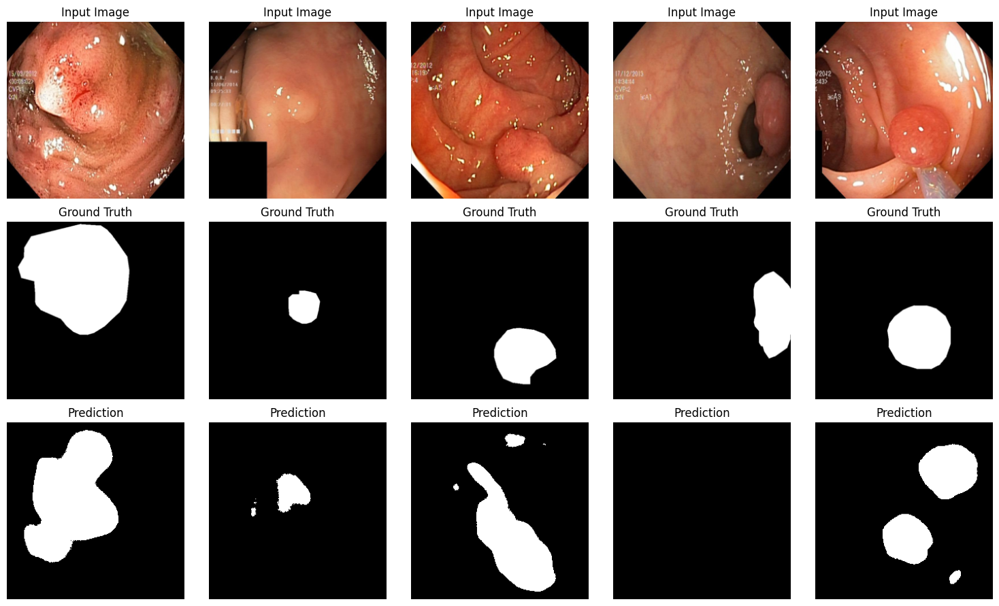

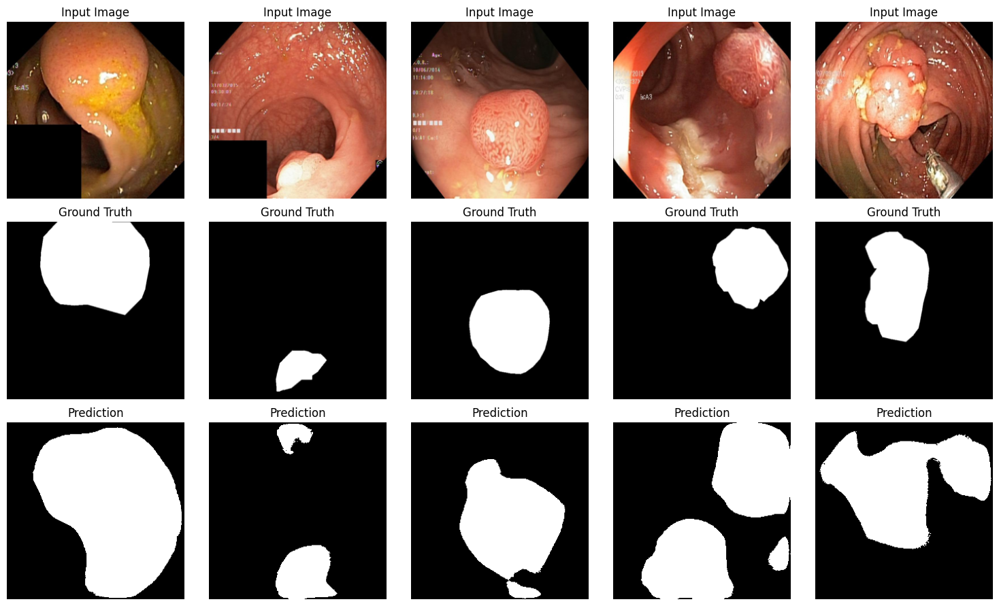

Checkpoint saved at epoch 5
Epoch 5/60 | Train - Loss: 0.8598, IoU: 0.4865, Precision: 0.5265, Recall: 0.8831, F1: 0.6488, Accuracy: 0.8540, Dice: 0.6488, BCE: 0.8540 | Validation - Loss: 1.0767, IoU: 0.3257, Precision: 0.3721, Recall: 0.7382, F1: 0.4862, Accuracy: 0.8342, Dice: 0.4862, BCE: 0.8342
Best model saved at epoch 6
Epoch 6/60 | Train - Loss: 0.7495, IoU: 0.6123, Precision: 0.6949, Recall: 0.8491, F1: 0.7565, Accuracy: 0.9176, Dice: 0.7565, BCE: 0.9176 | Validation - Loss: 1.0163, IoU: 0.3531, Precision: 0.4529, Recall: 0.6396, F1: 0.5160, Accuracy: 0.8733, Dice: 0.5160, BCE: 0.8733
Epoch 7/60 | Train - Loss: 0.6609, IoU: 0.6659, Precision: 0.7551, Recall: 0.8587, F1: 0.7968, Accuracy: 0.9346, Dice: 0.7968, BCE: 0.9346 | Validation - Loss: 1.1252, IoU: 0.3347, Precision: 0.3895, Recall: 0.6995, F1: 0.4961, Accuracy: 0.8513, Dice: 0.4961, BCE: 0.8513
Best model saved at epoch 8
Epoch 8/60 | Train - Loss: 0.5869, IoU: 0.6949, Precision: 0.7884, Recall: 0.8634, F1: 0.8183, Accur

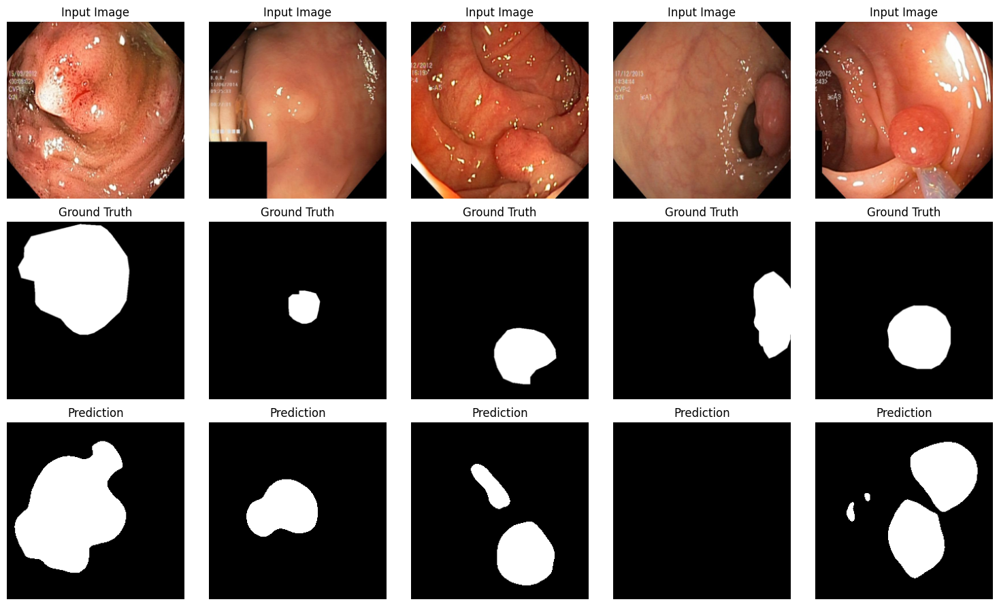

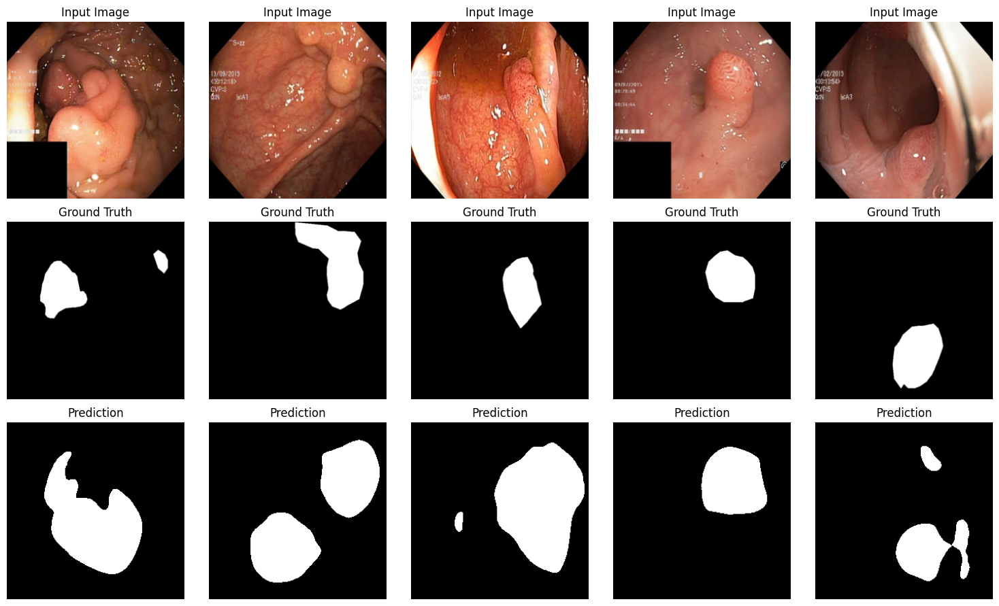

Checkpoint saved at epoch 10
Epoch 10/60 | Train - Loss: 0.4196, IoU: 0.7499, Precision: 0.8360, Recall: 0.8844, F1: 0.8560, Accuracy: 0.9554, Dice: 0.8560, BCE: 0.9554 | Validation - Loss: 1.0077, IoU: 0.3589, Precision: 0.4280, Recall: 0.7092, F1: 0.5240, Accuracy: 0.8626, Dice: 0.5240, BCE: 0.8626
Best model saved at epoch 11
Epoch 11/60 | Train - Loss: 0.3559, IoU: 0.7659, Precision: 0.8513, Recall: 0.8884, F1: 0.8666, Accuracy: 0.9587, Dice: 0.8666, BCE: 0.9587 | Validation - Loss: 0.9102, IoU: 0.3895, Precision: 0.4760, Recall: 0.7197, F1: 0.5553, Accuracy: 0.8804, Dice: 0.5553, BCE: 0.8804
Best model saved at epoch 12
Epoch 12/60 | Train - Loss: 0.3105, IoU: 0.7825, Precision: 0.8635, Recall: 0.8969, F1: 0.8769, Accuracy: 0.9620, Dice: 0.8769, BCE: 0.9620 | Validation - Loss: 0.9006, IoU: 0.3897, Precision: 0.4733, Recall: 0.7098, F1: 0.5559, Accuracy: 0.8808, Dice: 0.5559, BCE: 0.8808
Best model saved at epoch 13
Epoch 13/60 | Train - Loss: 0.2789, IoU: 0.7935, Precision: 0.871

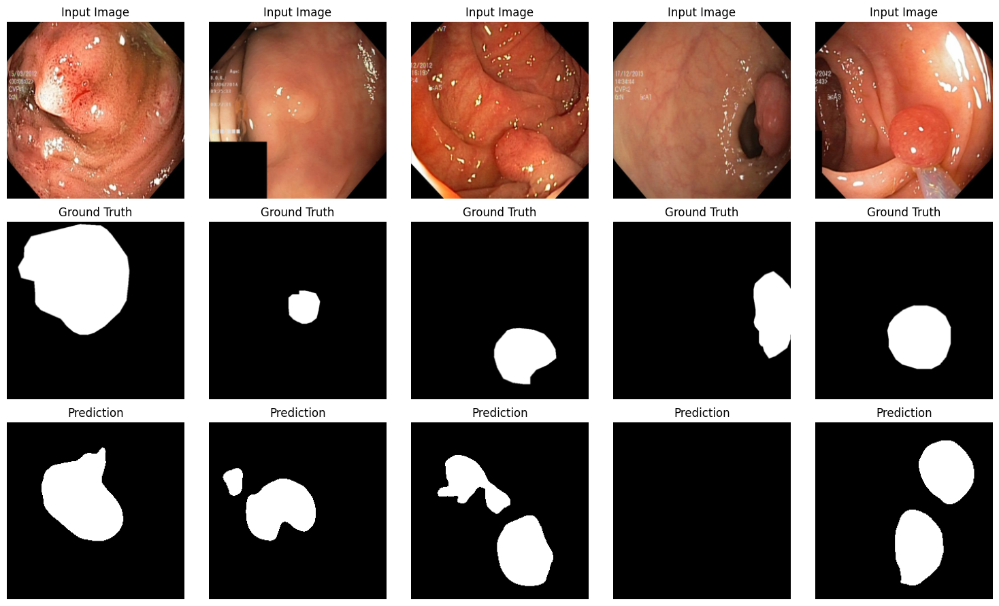

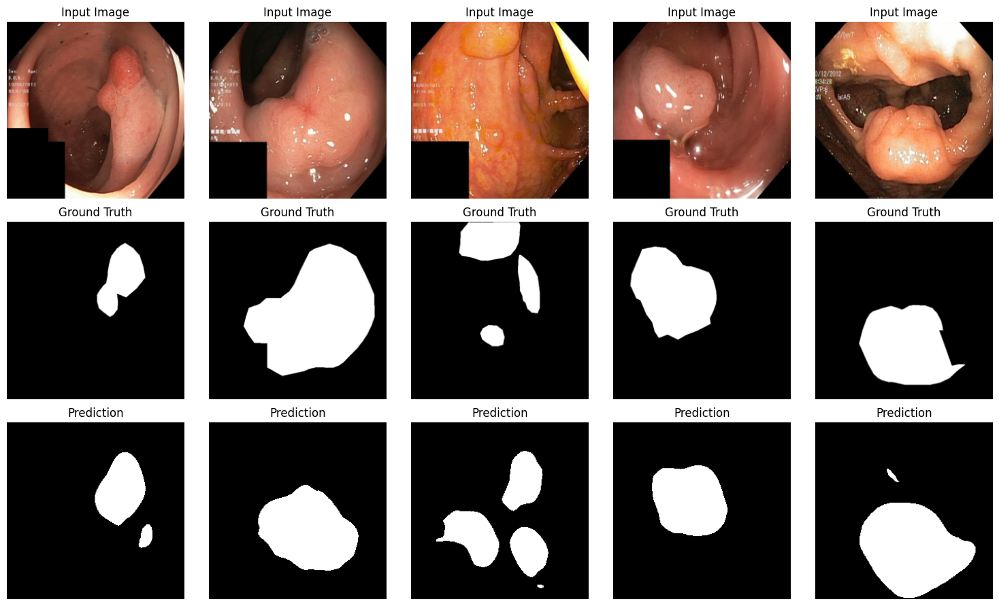

Checkpoint saved at epoch 15
Epoch 15/60 | Train - Loss: 0.2273, IoU: 0.8225, Precision: 0.8911, Recall: 0.9158, F1: 0.9021, Accuracy: 0.9701, Dice: 0.9021, BCE: 0.9701 | Validation - Loss: 0.8539, IoU: 0.3953, Precision: 0.5056, Recall: 0.6688, F1: 0.5605, Accuracy: 0.8897, Dice: 0.5605, BCE: 0.8897
Best model saved at epoch 16
Epoch 16/60 | Train - Loss: 0.1968, IoU: 0.8432, Precision: 0.9032, Recall: 0.9275, F1: 0.9145, Accuracy: 0.9737, Dice: 0.9145, BCE: 0.9737 | Validation - Loss: 0.8436, IoU: 0.3840, Precision: 0.5248, Recall: 0.5950, F1: 0.5464, Accuracy: 0.8964, Dice: 0.5464, BCE: 0.8964
Best model saved at epoch 17
Epoch 17/60 | Train - Loss: 0.1814, IoU: 0.8528, Precision: 0.9100, Recall: 0.9317, F1: 0.9202, Accuracy: 0.9755, Dice: 0.9202, BCE: 0.9755 | Validation - Loss: 0.7831, IoU: 0.4141, Precision: 0.5657, Recall: 0.6378, F1: 0.5788, Accuracy: 0.9030, Dice: 0.5788, BCE: 0.9030
Epoch 18/60 | Train - Loss: 0.1718, IoU: 0.8571, Precision: 0.9112, Recall: 0.9359, F1: 0.9226

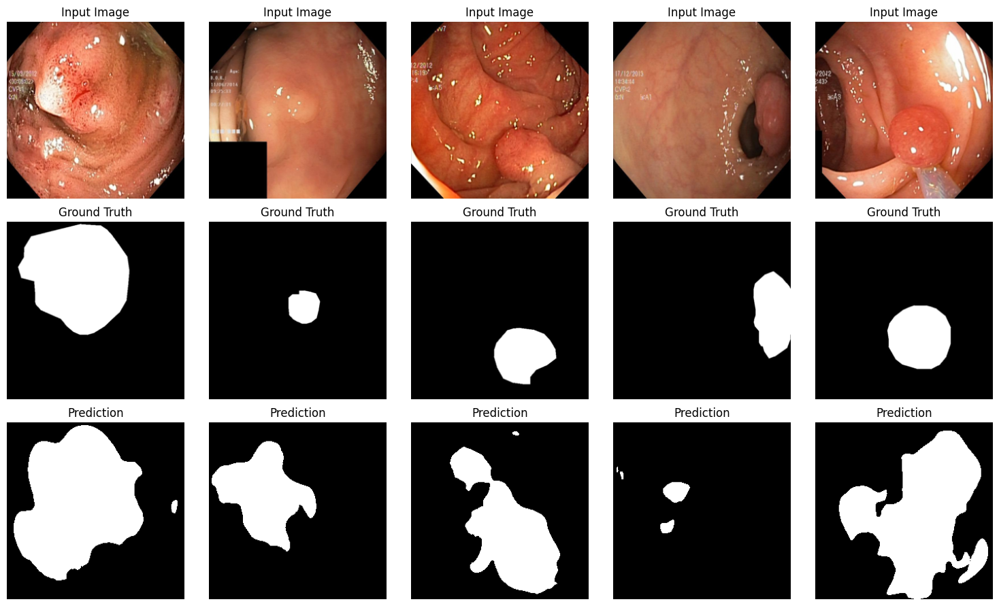

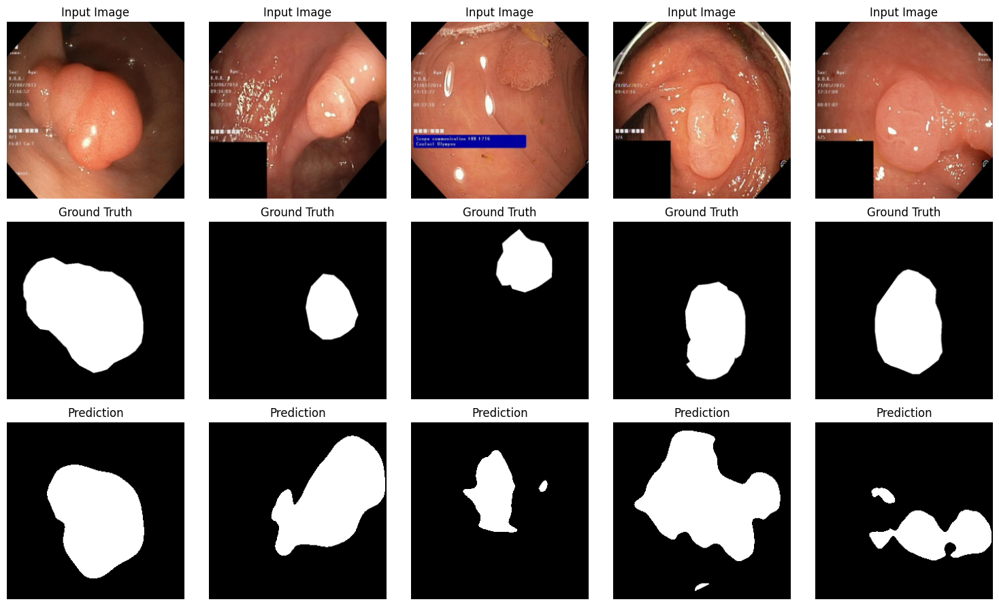

Checkpoint saved at epoch 20
Epoch 20/60 | Train - Loss: 0.1594, IoU: 0.8627, Precision: 0.9170, Recall: 0.9365, F1: 0.9260, Accuracy: 0.9775, Dice: 0.9260, BCE: 0.9775 | Validation - Loss: 0.8984, IoU: 0.3870, Precision: 0.4790, Recall: 0.6940, F1: 0.5518, Accuracy: 0.8835, Dice: 0.5518, BCE: 0.8835
Epoch 21/60 | Train - Loss: 0.1507, IoU: 0.8680, Precision: 0.9188, Recall: 0.9407, F1: 0.9290, Accuracy: 0.9782, Dice: 0.9290, BCE: 0.9782 | Validation - Loss: 0.8990, IoU: 0.3978, Precision: 0.4973, Recall: 0.6713, F1: 0.5610, Accuracy: 0.8898, Dice: 0.5610, BCE: 0.8898
Epoch 22/60 | Train - Loss: 0.1517, IoU: 0.8656, Precision: 0.9180, Recall: 0.9384, F1: 0.9276, Accuracy: 0.9778, Dice: 0.9276, BCE: 0.9778 | Validation - Loss: 0.8613, IoU: 0.3803, Precision: 0.5738, Recall: 0.5561, F1: 0.5444, Accuracy: 0.9009, Dice: 0.5444, BCE: 0.9009
Epoch 23/60 | Train - Loss: 0.1360, IoU: 0.8777, Precision: 0.9249, Recall: 0.9455, F1: 0.9347, Accuracy: 0.9799, Dice: 0.9347, BCE: 0.9799 | Validation

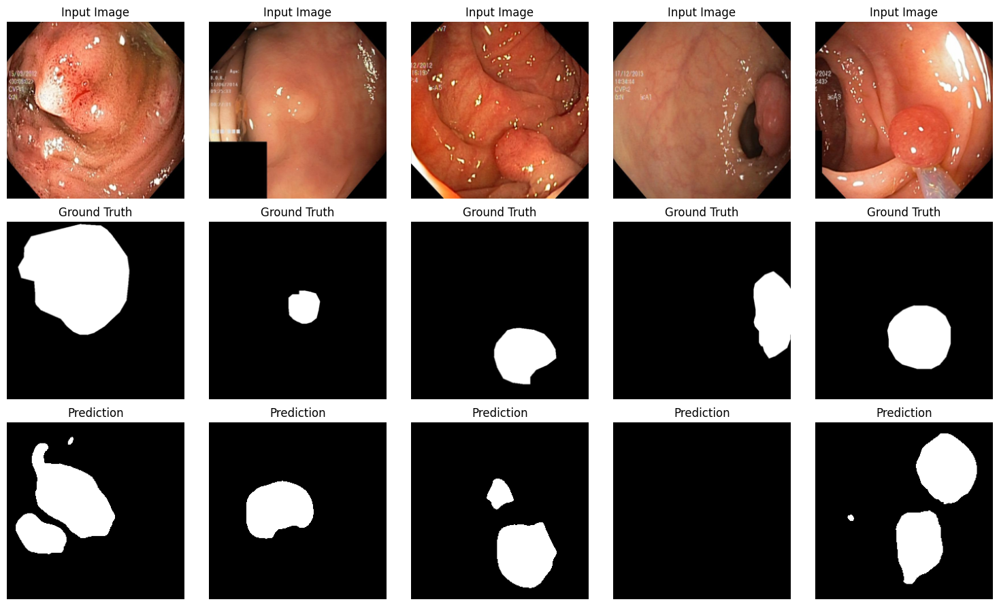

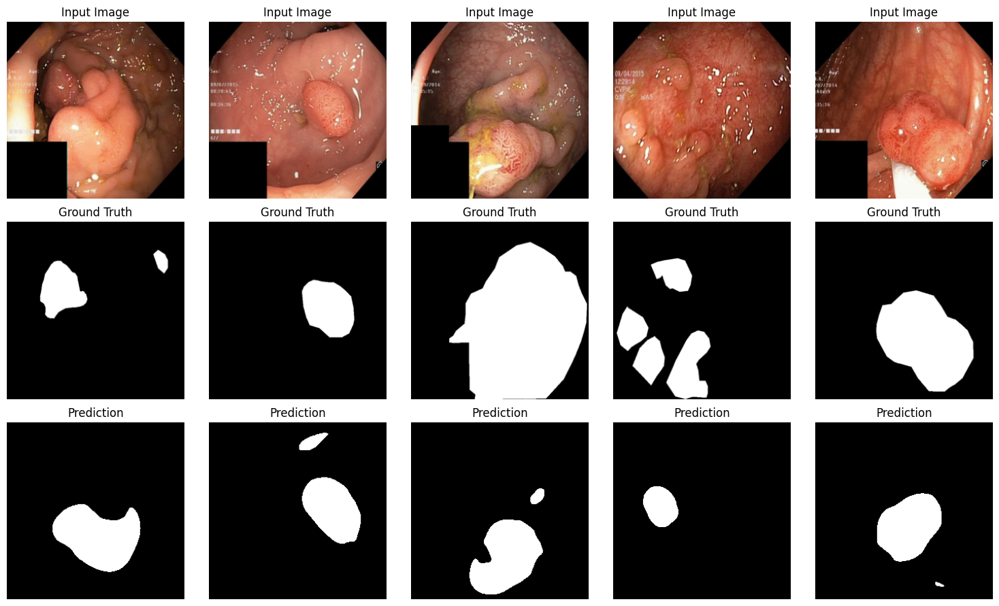

Checkpoint saved at epoch 25
Epoch 25/60 | Train - Loss: 0.1209, IoU: 0.8886, Precision: 0.9301, Recall: 0.9522, F1: 0.9408, Accuracy: 0.9818, Dice: 0.9408, BCE: 0.9818 | Validation - Loss: 0.8900, IoU: 0.3926, Precision: 0.5687, Recall: 0.5897, F1: 0.5570, Accuracy: 0.8998, Dice: 0.5570, BCE: 0.8998
Epoch 26/60 | Train - Loss: 0.1151, IoU: 0.8924, Precision: 0.9327, Recall: 0.9541, F1: 0.9430, Accuracy: 0.9825, Dice: 0.9430, BCE: 0.9825 | Validation - Loss: 0.8520, IoU: 0.4038, Precision: 0.5490, Recall: 0.6301, F1: 0.5692, Accuracy: 0.8996, Dice: 0.5692, BCE: 0.8996
Epoch 27/60 | Train - Loss: 0.1069, IoU: 0.8985, Precision: 0.9365, Recall: 0.9568, F1: 0.9464, Accuracy: 0.9837, Dice: 0.9464, BCE: 0.9837 | Validation - Loss: 0.9232, IoU: 0.3929, Precision: 0.4812, Recall: 0.6942, F1: 0.5575, Accuracy: 0.8852, Dice: 0.5575, BCE: 0.8852
Epoch 28/60 | Train - Loss: 0.1073, IoU: 0.8979, Precision: 0.9356, Recall: 0.9572, F1: 0.9461, Accuracy: 0.9835, Dice: 0.9461, BCE: 0.9835 | Validation

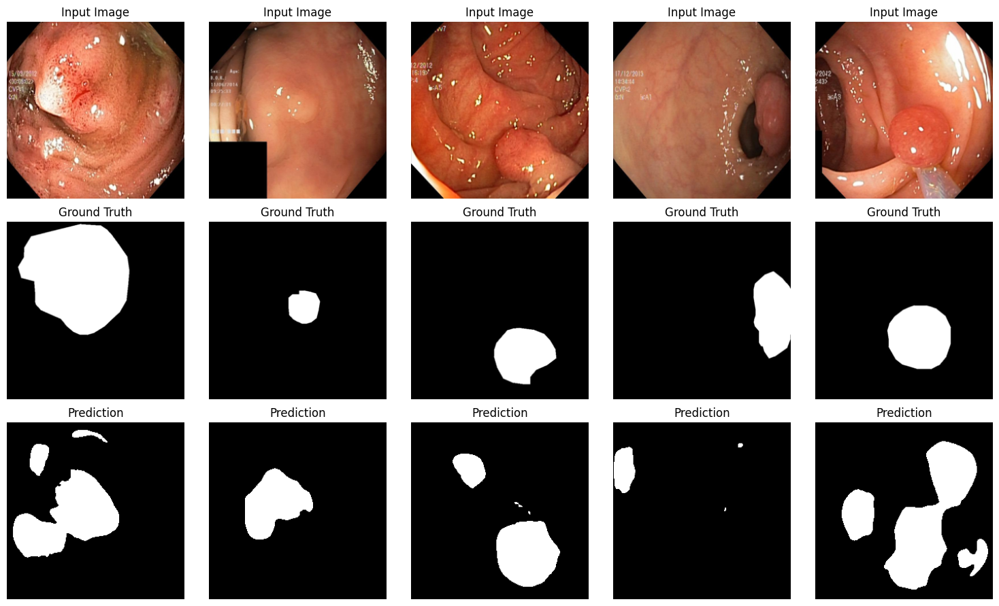

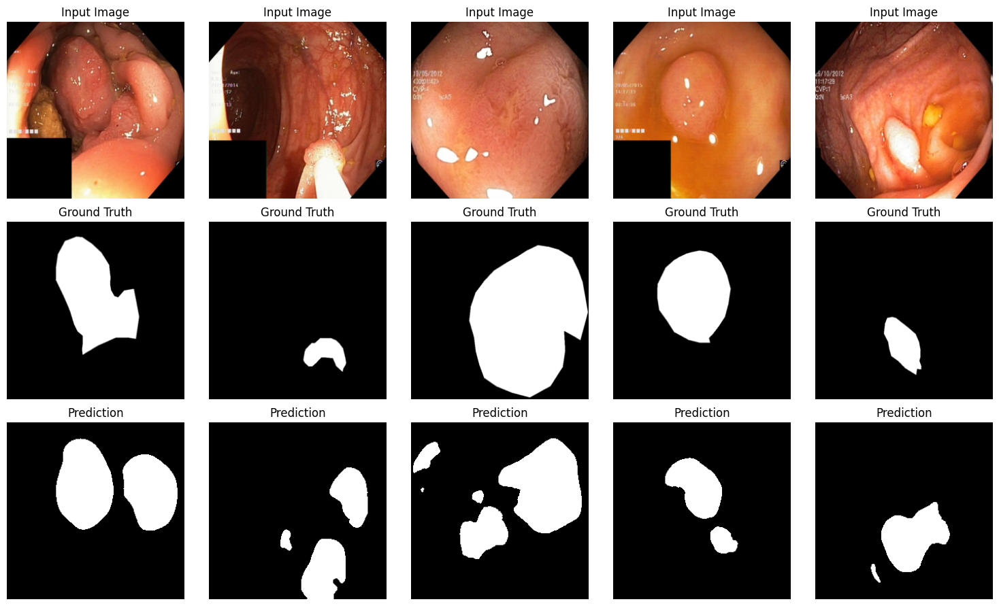

Checkpoint saved at epoch 30
Epoch 30/60 | Train - Loss: 0.1031, IoU: 0.9006, Precision: 0.9376, Recall: 0.9581, F1: 0.9476, Accuracy: 0.9839, Dice: 0.9476, BCE: 0.9839 | Validation - Loss: 0.9538, IoU: 0.3917, Precision: 0.4935, Recall: 0.6574, F1: 0.5525, Accuracy: 0.8878, Dice: 0.5525, BCE: 0.8878
Epoch 31/60 | Train - Loss: 0.0924, IoU: 0.9089, Precision: 0.9410, Recall: 0.9637, F1: 0.9521, Accuracy: 0.9854, Dice: 0.9521, BCE: 0.9854 | Validation - Loss: 0.9400, IoU: 0.3736, Precision: 0.5399, Recall: 0.5532, F1: 0.5354, Accuracy: 0.8979, Dice: 0.5354, BCE: 0.8979
Epoch 32/60 | Train - Loss: 0.1029, IoU: 0.8997, Precision: 0.9373, Recall: 0.9575, F1: 0.9471, Accuracy: 0.9839, Dice: 0.9471, BCE: 0.9839 | Validation - Loss: 0.8744, IoU: 0.4127, Precision: 0.5690, Recall: 0.6291, F1: 0.5774, Accuracy: 0.9029, Dice: 0.5774, BCE: 0.9029
Epoch 33/60 | Train - Loss: 0.0935, IoU: 0.9072, Precision: 0.9396, Recall: 0.9634, F1: 0.9512, Accuracy: 0.9851, Dice: 0.9512, BCE: 0.9851 | Validation

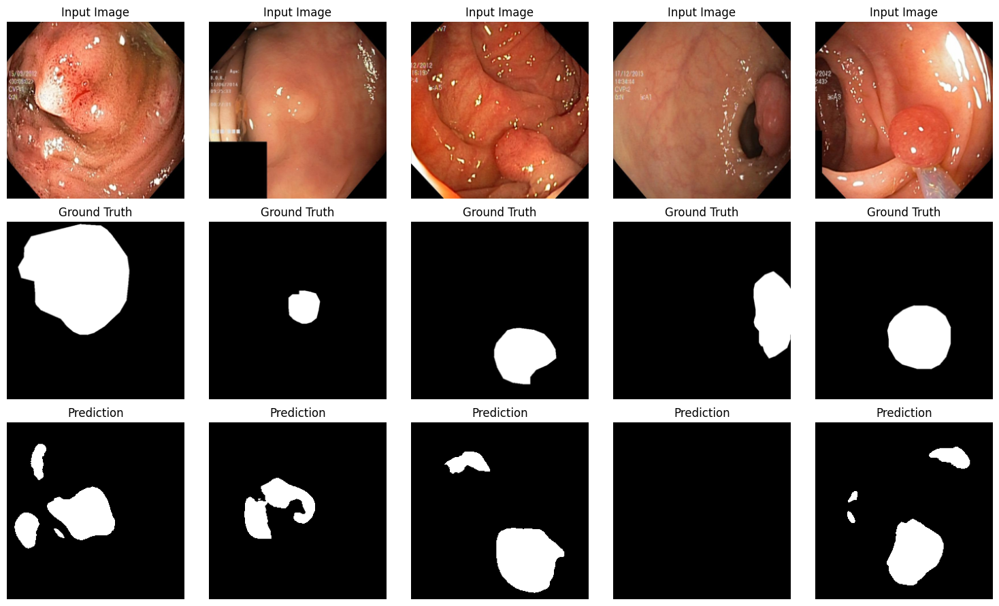

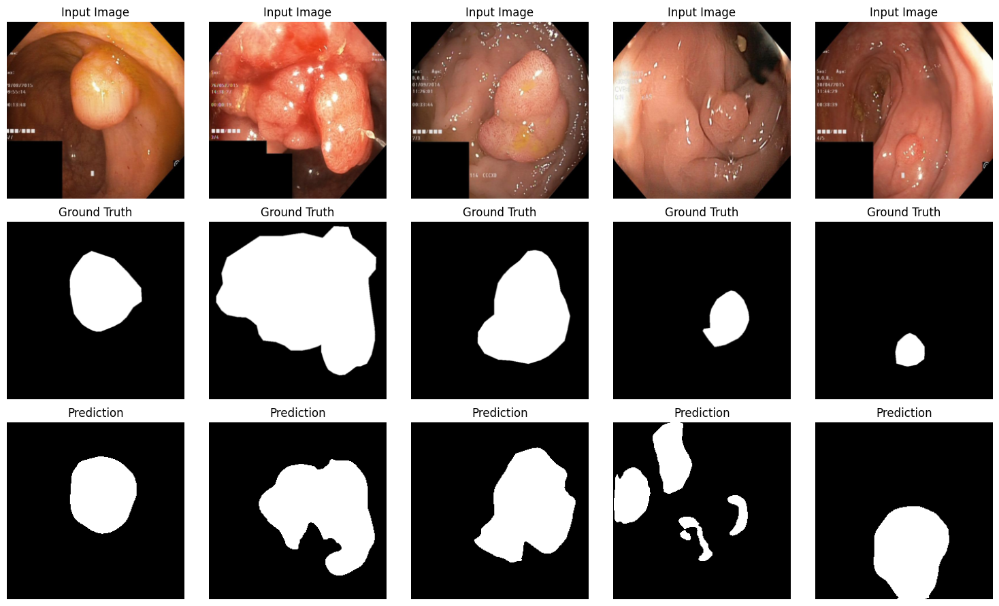

Checkpoint saved at epoch 35
Epoch 35/60 | Train - Loss: 0.0895, IoU: 0.9104, Precision: 0.9424, Recall: 0.9641, F1: 0.9530, Accuracy: 0.9856, Dice: 0.9530, BCE: 0.9856 | Validation - Loss: 0.8858, IoU: 0.4177, Precision: 0.5263, Recall: 0.6879, F1: 0.5810, Accuracy: 0.8955, Dice: 0.5810, BCE: 0.8955
Epoch 36/60 | Train - Loss: 0.0884, IoU: 0.9110, Precision: 0.9427, Recall: 0.9646, F1: 0.9533, Accuracy: 0.9858, Dice: 0.9533, BCE: 0.9858 | Validation - Loss: 0.9572, IoU: 0.3986, Precision: 0.4808, Recall: 0.7066, F1: 0.5629, Accuracy: 0.8860, Dice: 0.5629, BCE: 0.8860
Epoch 37/60 | Train - Loss: 0.0982, IoU: 0.9028, Precision: 0.9387, Recall: 0.9595, F1: 0.9488, Accuracy: 0.9842, Dice: 0.9488, BCE: 0.9842 | Validation - Loss: 0.9394, IoU: 0.3845, Precision: 0.5426, Recall: 0.6056, F1: 0.5481, Accuracy: 0.8950, Dice: 0.5481, BCE: 0.8950
Epoch 38/60 | Train - Loss: 0.1044, IoU: 0.8976, Precision: 0.9368, Recall: 0.9556, F1: 0.9458, Accuracy: 0.9835, Dice: 0.9458, BCE: 0.9835 | Validation

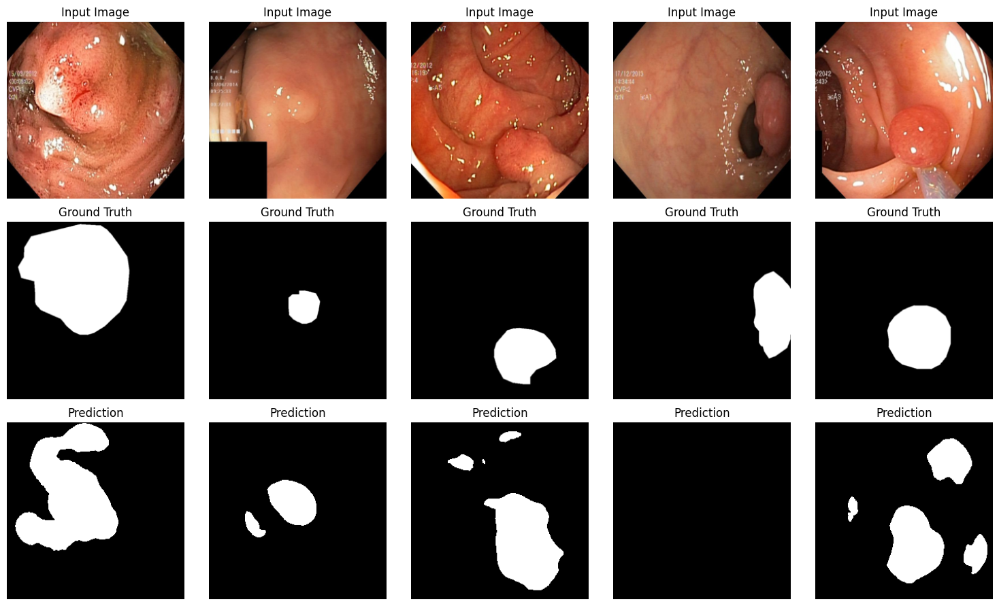

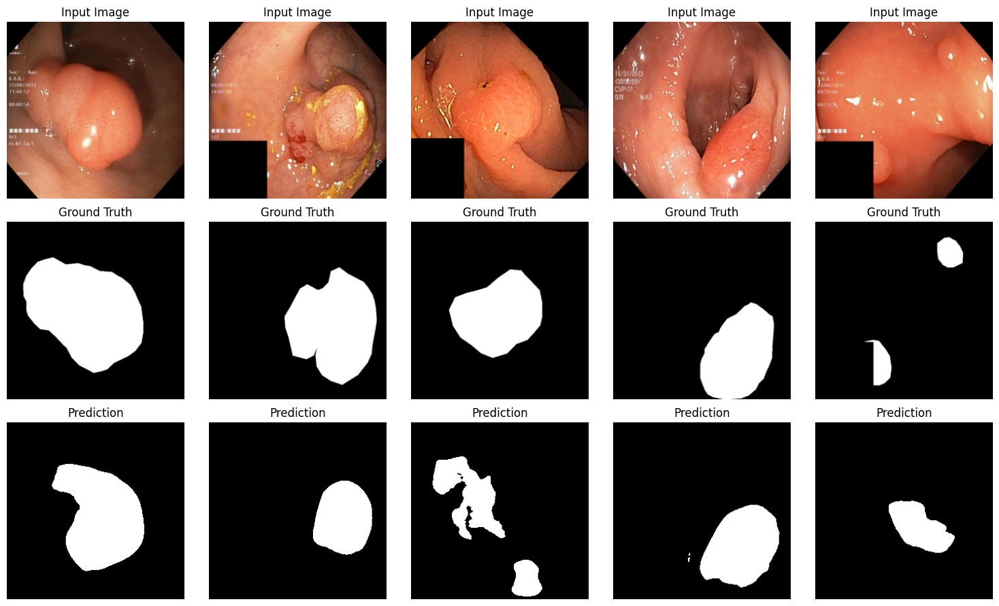

Checkpoint saved at epoch 40
Epoch 40/60 | Train - Loss: 0.1007, IoU: 0.9006, Precision: 0.9353, Recall: 0.9604, F1: 0.9472, Accuracy: 0.9841, Dice: 0.9472, BCE: 0.9841 | Validation - Loss: 1.0074, IoU: 0.3987, Precision: 0.5182, Recall: 0.6491, F1: 0.5601, Accuracy: 0.8923, Dice: 0.5601, BCE: 0.8923
Epoch 41/60 | Train - Loss: 0.0880, IoU: 0.9114, Precision: 0.9432, Recall: 0.9642, F1: 0.9535, Accuracy: 0.9857, Dice: 0.9535, BCE: 0.9857 | Validation - Loss: 0.9115, IoU: 0.4178, Precision: 0.5109, Recall: 0.7070, F1: 0.5819, Accuracy: 0.8933, Dice: 0.5819, BCE: 0.8933
Epoch 42/60 | Train - Loss: 0.0786, IoU: 0.9186, Precision: 0.9465, Recall: 0.9689, F1: 0.9575, Accuracy: 0.9869, Dice: 0.9575, BCE: 0.9869 | Validation - Loss: 0.9061, IoU: 0.4144, Precision: 0.5753, Recall: 0.6029, F1: 0.5756, Accuracy: 0.9069, Dice: 0.5756, BCE: 0.9069
Epoch 43/60 | Train - Loss: 0.0790, IoU: 0.9180, Precision: 0.9464, Recall: 0.9684, F1: 0.9572, Accuracy: 0.9869, Dice: 0.9572, BCE: 0.9869 | Validation

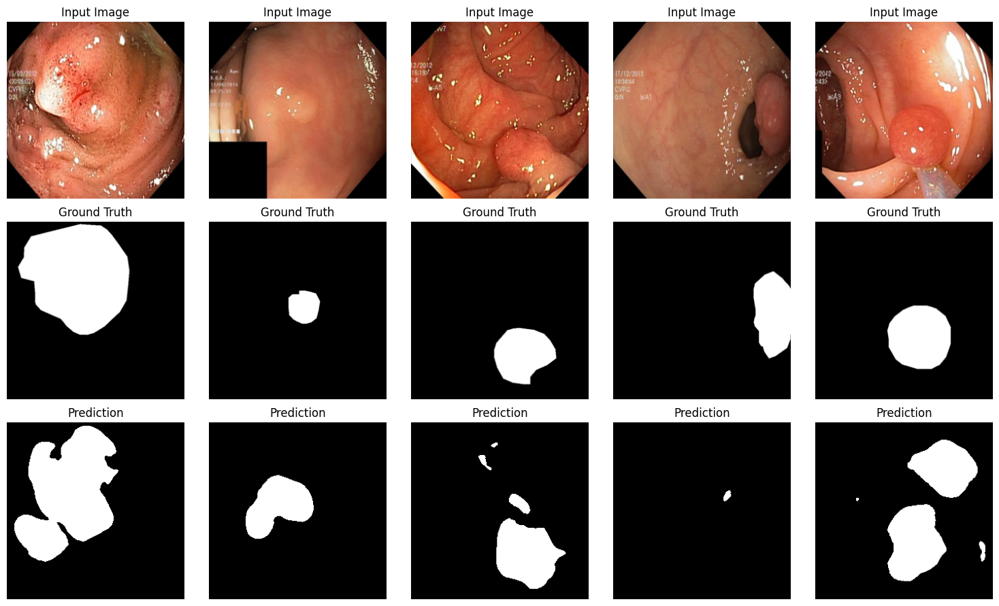

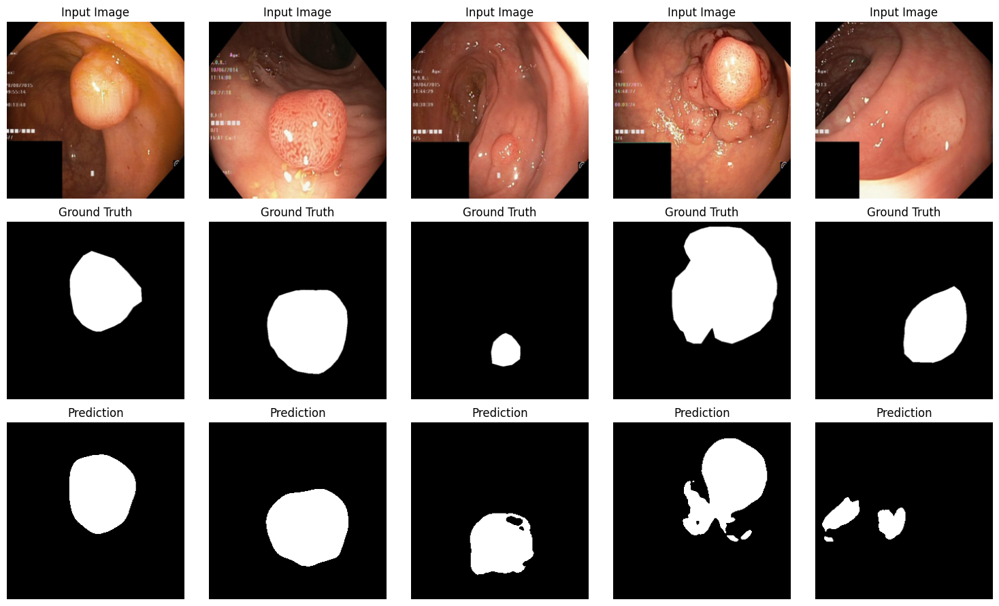

Checkpoint saved at epoch 45
Epoch 45/60 | Train - Loss: 0.0651, IoU: 0.9291, Precision: 0.9521, Recall: 0.9746, F1: 0.9632, Accuracy: 0.9887, Dice: 0.9632, BCE: 0.9887 | Validation - Loss: 0.9067, IoU: 0.4284, Precision: 0.5484, Recall: 0.6920, F1: 0.5949, Accuracy: 0.9022, Dice: 0.5949, BCE: 0.9022
Epoch 46/60 | Train - Loss: 0.0658, IoU: 0.9283, Precision: 0.9518, Recall: 0.9740, F1: 0.9627, Accuracy: 0.9886, Dice: 0.9627, BCE: 0.9886 | Validation - Loss: 0.9162, IoU: 0.4201, Precision: 0.5646, Recall: 0.6326, F1: 0.5820, Accuracy: 0.9034, Dice: 0.5820, BCE: 0.9034
Epoch 47/60 | Train - Loss: 0.0663, IoU: 0.9280, Precision: 0.9520, Recall: 0.9735, F1: 0.9626, Accuracy: 0.9886, Dice: 0.9626, BCE: 0.9886 | Validation - Loss: 0.9174, IoU: 0.4266, Precision: 0.5440, Recall: 0.6779, F1: 0.5905, Accuracy: 0.9009, Dice: 0.5905, BCE: 0.9009
Epoch 48/60 | Train - Loss: 0.0973, IoU: 0.9025, Precision: 0.9378, Recall: 0.9599, F1: 0.9484, Accuracy: 0.9843, Dice: 0.9484, BCE: 0.9843 | Validation

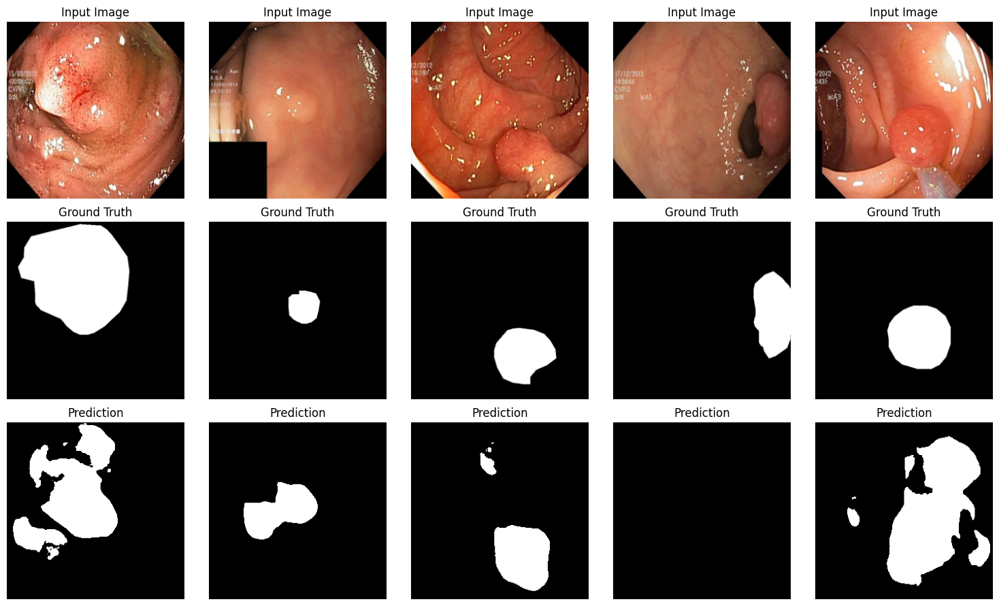

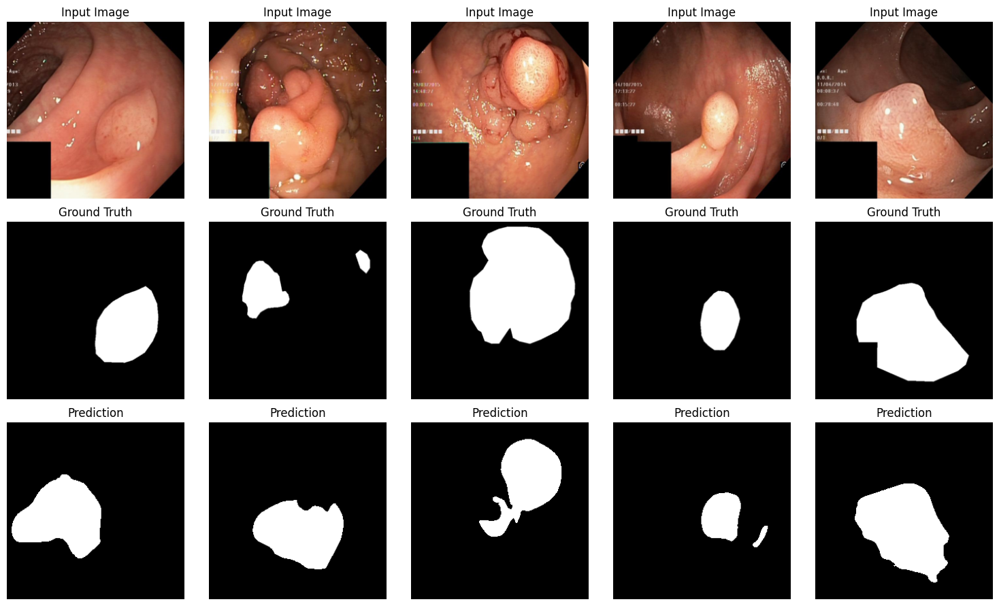

Checkpoint saved at epoch 50
Epoch 50/60 | Train - Loss: 0.0944, IoU: 0.9056, Precision: 0.9408, Recall: 0.9605, F1: 0.9503, Accuracy: 0.9845, Dice: 0.9503, BCE: 0.9845 | Validation - Loss: 0.9680, IoU: 0.3923, Precision: 0.4772, Recall: 0.7051, F1: 0.5562, Accuracy: 0.8807, Dice: 0.5562, BCE: 0.8807
Epoch 51/60 | Train - Loss: 0.0725, IoU: 0.9225, Precision: 0.9484, Recall: 0.9713, F1: 0.9597, Accuracy: 0.9876, Dice: 0.9597, BCE: 0.9876 | Validation - Loss: 0.9505, IoU: 0.4030, Precision: 0.5686, Recall: 0.6040, F1: 0.5662, Accuracy: 0.9027, Dice: 0.5662, BCE: 0.9027
Epoch 52/60 | Train - Loss: 0.0651, IoU: 0.9284, Precision: 0.9517, Recall: 0.9743, F1: 0.9628, Accuracy: 0.9887, Dice: 0.9628, BCE: 0.9887 | Validation - Loss: 0.9545, IoU: 0.4093, Precision: 0.5391, Recall: 0.6340, F1: 0.5706, Accuracy: 0.8989, Dice: 0.5706, BCE: 0.8989
Epoch 53/60 | Train - Loss: 0.0681, IoU: 0.9259, Precision: 0.9508, Recall: 0.9724, F1: 0.9614, Accuracy: 0.9882, Dice: 0.9614, BCE: 0.9882 | Validation

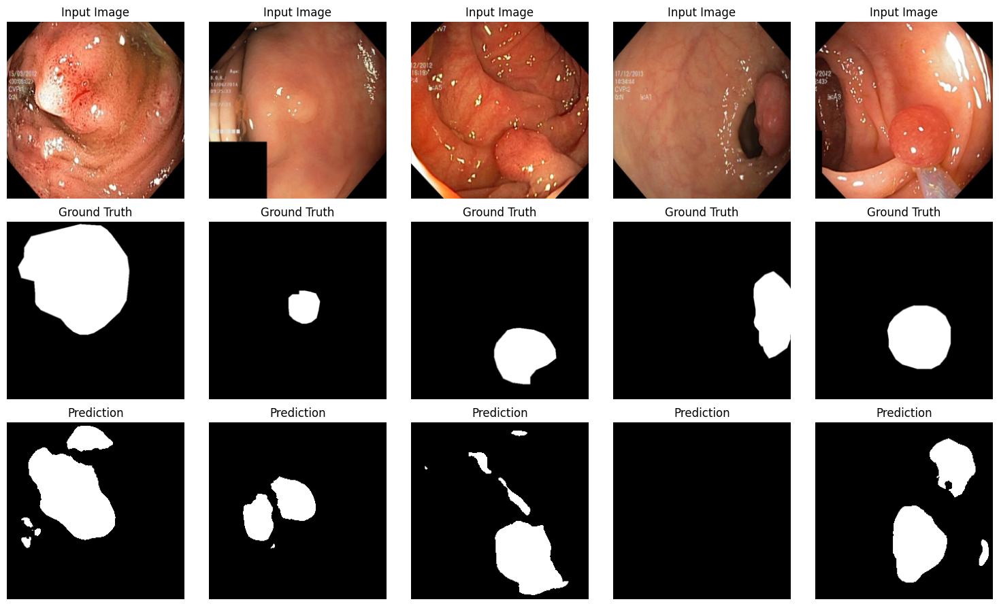

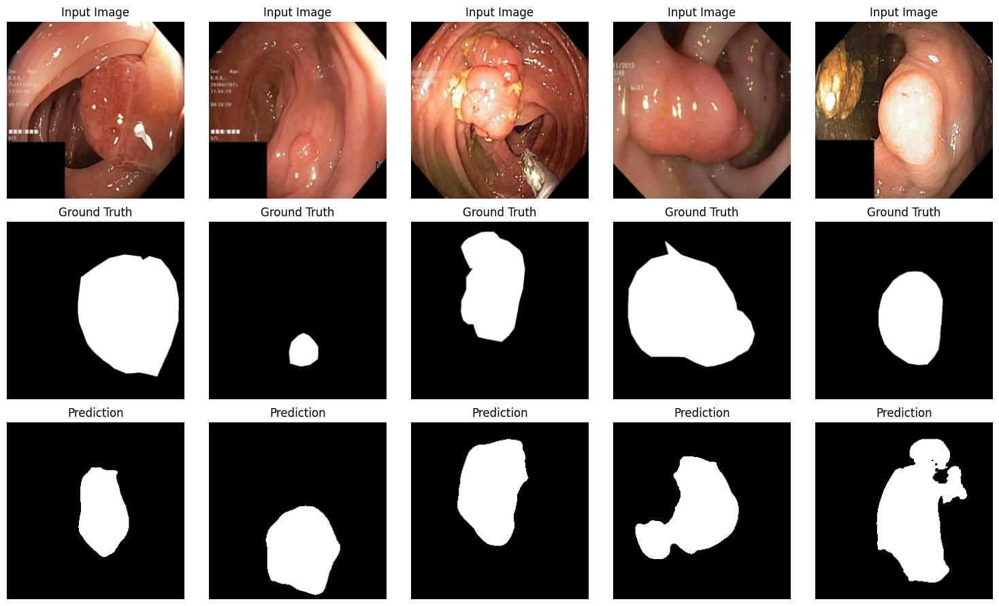

Checkpoint saved at epoch 55
Epoch 55/60 | Train - Loss: 0.0591, IoU: 0.9333, Precision: 0.9542, Recall: 0.9770, F1: 0.9654, Accuracy: 0.9894, Dice: 0.9654, BCE: 0.9894 | Validation - Loss: 0.9372, IoU: 0.4224, Precision: 0.5702, Recall: 0.6575, F1: 0.5874, Accuracy: 0.9031, Dice: 0.5874, BCE: 0.9031
Epoch 56/60 | Train - Loss: 0.0572, IoU: 0.9346, Precision: 0.9547, Recall: 0.9780, F1: 0.9662, Accuracy: 0.9896, Dice: 0.9662, BCE: 0.9896 | Validation - Loss: 1.0315, IoU: 0.4043, Precision: 0.5298, Recall: 0.6485, F1: 0.5679, Accuracy: 0.8965, Dice: 0.5679, BCE: 0.8965
Epoch 57/60 | Train - Loss: 0.0553, IoU: 0.9360, Precision: 0.9557, Recall: 0.9784, F1: 0.9669, Accuracy: 0.9900, Dice: 0.9669, BCE: 0.9900 | Validation - Loss: 0.9757, IoU: 0.4197, Precision: 0.5541, Recall: 0.6530, F1: 0.5827, Accuracy: 0.9005, Dice: 0.5827, BCE: 0.9005
Epoch 58/60 | Train - Loss: 0.0626, IoU: 0.9302, Precision: 0.9526, Recall: 0.9753, F1: 0.9637, Accuracy: 0.9889, Dice: 0.9637, BCE: 0.9889 | Validation

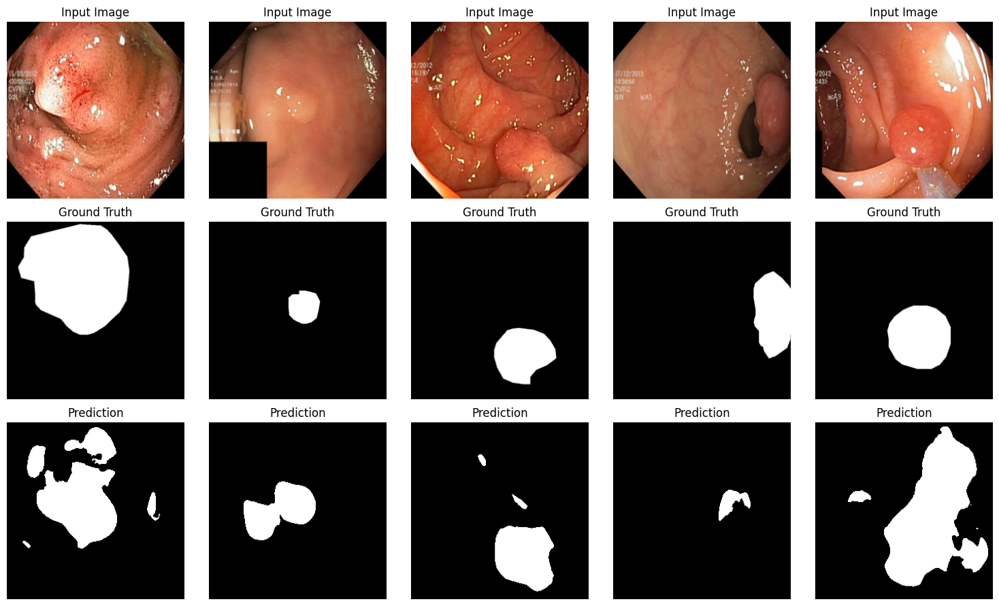

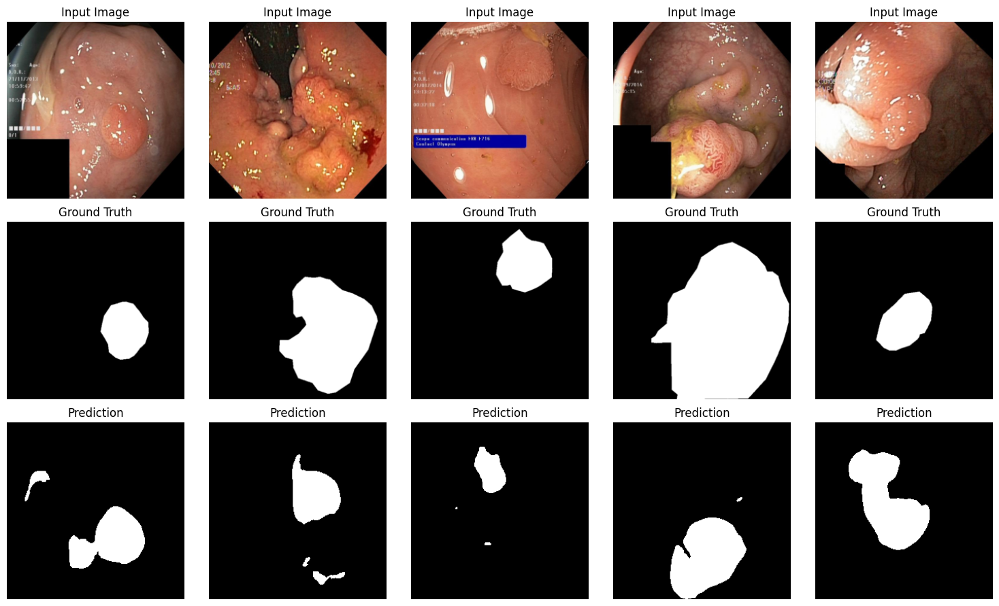

Checkpoint saved at epoch 60
Epoch 60/60 | Train - Loss: 0.0657, IoU: 0.9281, Precision: 0.9508, Recall: 0.9749, F1: 0.9625, Accuracy: 0.9884, Dice: 0.9625, BCE: 0.9884 | Validation - Loss: 0.9815, IoU: 0.4140, Precision: 0.5323, Recall: 0.6659, F1: 0.5792, Accuracy: 0.8978, Dice: 0.5792, BCE: 0.8978


In [9]:
import torch
import torch.nn as nn
import csv
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Dice Loss
def dice_loss(pred, target, smooth=1e-6):
    pred = torch.sigmoid(pred)
    target = target.float()
    intersection = (pred * target).sum()
    return 1 - (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)

# Binary Cross Entropy Loss
bce_loss = nn.BCEWithLogitsLoss()

def combined_loss(pred, target):
    dice = dice_loss(pred, target)
    bce = bce_loss(pred, target)
    return bce + dice, bce, dice

def calculate_metrics(outputs, masks):
    preds = (torch.sigmoid(outputs) > 0.5).float()
    masks = masks.int()
    preds = preds.view(-1).cpu().numpy()
    masks = masks.view(-1).cpu().numpy()
    
    precision = precision_score(masks, preds, zero_division=0)
    recall = recall_score(masks, preds, zero_division=0)
    f1 = f1_score(masks, preds, zero_division=0)
    accuracy = accuracy_score(masks, preds)
    dice = 2 * (precision * recall) / (precision + recall + 1e-7)
    bce = ((preds * masks) + ((1 - preds) * (1 - masks))).mean()
    
    return precision, recall, f1, accuracy, dice, bce

def train(model, dataloader, optimizer, device):
    model.train()
    epoch_loss = 0
    iou_total, precision_total, recall_total, f1_total, accuracy_total, dice_total, bce_total = 0, 0, 0, 0, 0, 0, 0
    
    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device).float()
        optimizer.zero_grad()
        outputs = model(images)
        
        total_loss, bce, dice = combined_loss(outputs, masks)
        total_loss.backward()
        optimizer.step()
        
        epoch_loss += total_loss.item()
        iou_total += iou_score(outputs, masks)
        
        precision, recall, f1, accuracy, dice, bce = calculate_metrics(outputs, masks)
        precision_total += precision
        recall_total += recall
        f1_total += f1
        accuracy_total += accuracy
        dice_total += dice
        bce_total += bce
    
    num_batches = len(dataloader)
    return {
        'loss': epoch_loss / num_batches,
        'iou': iou_total / num_batches,
        'precision': precision_total / num_batches,
        'recall': recall_total / num_batches,
        'f1': f1_total / num_batches,
        'accuracy': accuracy_total / num_batches,
        'dice': dice_total / num_batches,
        'bce': bce_total / num_batches
    }

def evaluate(model, dataloader, device):
    model.eval()
    val_loss = 0
    iou_total, precision_total, recall_total, f1_total, accuracy_total, dice_total, bce_total = 0, 0, 0, 0, 0, 0, 0
    
    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device).float()
            outputs = model(images)
            
            total_loss, bce, dice = combined_loss(outputs, masks)
            val_loss += total_loss.item()
            iou_total += iou_score(outputs, masks)
            
            precision, recall, f1, accuracy, dice, bce = calculate_metrics(outputs, masks)
            precision_total += precision
            recall_total += recall
            f1_total += f1
            accuracy_total += accuracy
            dice_total += dice
            bce_total += bce
    
    num_batches = len(dataloader)
    return {
        'loss': val_loss / num_batches,
        'iou': iou_total / num_batches,
        'precision': precision_total / num_batches,
        'recall': recall_total / num_batches,
        'f1': f1_total / num_batches,
        'accuracy': accuracy_total / num_batches,
        'dice': dice_total / num_batches,
        'bce': bce_total / num_batches
    }


num_epochs = 60
csv_filename = "training_results.csv"
best_val_loss = float('inf')

with open(csv_filename, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Epoch", "Train Loss", "Train IoU", "Train Precision", "Train Recall", "Train F1", "Train Accuracy", "Train Dice", "Train BCE",
                     "Val Loss", "Val IoU", "Val Precision", "Val Recall", "Val F1", "Val Accuracy", "Val Dice", "Val BCE"])

    for epoch in range(num_epochs):
        train_metrics = train(model, train_loader, optimizer, device)
        val_metrics = evaluate(model, test_loader, device)
        
        # Save best model based on validation loss
        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            torch.save(model.state_dict(), "best_model.pth")
            print(f"Best model saved at epoch {epoch+1}")

        # Save model checkpoint every 10 epochs
        if (epoch + 1) % 5 == 0 :
            torch.save(model.state_dict(), f"checkpoint_epoch_{epoch+1}.pth")
            visualize_predictions()
            print(f"Checkpoint saved at epoch {epoch+1}")
            
        # Log results
        writer.writerow([epoch+1, train_metrics['loss'], train_metrics['iou'], train_metrics['precision'], train_metrics['recall'], train_metrics['f1'], train_metrics['accuracy'], train_metrics['dice'], train_metrics['bce'],
                         val_metrics['loss'], val_metrics['iou'], val_metrics['precision'], val_metrics['recall'], val_metrics['f1'], val_metrics['accuracy'], val_metrics['dice'], val_metrics['bce']])
        print(
            f"Epoch {epoch+1}/{num_epochs} | "
            f"Train - Loss: {train_metrics['loss']:.4f}, IoU: {train_metrics['iou']:.4f}, "
            f"Precision: {train_metrics['precision']:.4f}, Recall: {train_metrics['recall']:.4f}, "
            f"F1: {train_metrics['f1']:.4f}, Accuracy: {train_metrics['accuracy']:.4f}, "
            f"Dice: {train_metrics['dice']:.4f}, BCE: {train_metrics['bce']:.4f} | "
            f"Validation - Loss: {val_metrics['loss']:.4f}, IoU: {val_metrics['iou']:.4f}, "
            f"Precision: {val_metrics['precision']:.4f}, Recall: {val_metrics['recall']:.4f}, "
            f"F1: {val_metrics['f1']:.4f}, Accuracy: {val_metrics['accuracy']:.4f}, "
            f"Dice: {val_metrics['dice']:.4f}, BCE: {val_metrics['bce']:.4f}"
        )


``` python
import torch
import matplotlib.pyplot as plt

def visualize_predictions():
    model.eval()
    with torch.no_grad():
        inputs, targets = next(iter(test_loader))  # Take a batch
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = torch.sigmoid(outputs)
        outputs = (outputs > 0.5).float()  # Apply threshold to get binary mask

        fig, axes = plt.subplots(3, 5, figsize=(15, 9))
        for i in range(5):
            # Handle single-channel vs. RGB images
            if inputs.shape[1] == 1:  # Grayscale images
                axes[0, i].imshow(inputs[i].cpu().squeeze(), cmap='gray')
            else:  # RGB images
                axes[0, i].imshow(inputs[i].cpu().permute(1, 2, 0))
            axes[0, i].set_title("Input Image")

            axes[1, i].imshow(targets[i].cpu().squeeze(), cmap='gray')
            axes[1, i].set_title("Ground Truth")

            axes[2, i].imshow(outputs[i].cpu().squeeze(), cmap='gray')
            axes[2, i].set_title("Prediction")

            for ax in axes[:, i]:
                ax.axis("off")  # Hide axes for cleaner visualization
        
        plt.tight_layout()
        plt.show()
visualize_predictions()
```